# Project description


Ask a buyer to describe their dream home and they probably won't start with basement ceiling height or proximity to an east-west rail line. But the data set from this playground contest proves that price negotiations are influenced by much more than the number of bedrooms or a white picket fence.

![](https://storage.googleapis.com/kaggle-competitions/kaggle/5407/media/housesbanner.png)

This dataset contains 79 explanatory variables describing almost every aspect of residential homes in Ames, Iowa. 

**Goal:** It is your job to predict the sales price for each house using everything you have learned so far. If **you use a model not presented in class, you must justify it, explain how it works and describe precisely the role of each of the hyper-parameters**. For each Id in the test set, you must predict the value of the SalePrice variable. 

**Metric:** Predictions are evaluated on Root-Mean-Squared-Error (RMSE) between the logarithm of the predicted value and the logarithm of the observed sales price. (Taking logs means that errors in predicting expensive houses and cheap houses will affect the result equally.)

**Homework submission**: You must upload a zip archive containing 3 files to``lms.univ-cotedazur.fr`:

* A `pdf` report describing for each of the selected features the treatment performed
* A `jupyter notebook` performing the preprocessing, each step of which is inserted into a sklearn or imblearn pipeline (you must leave traces of notebook executions. The first cell should have the number 1, the second the number 2, etc.)
* A `result.csv` should contain your prediction for each of the properties in tthe test set in the the following format:
<pre>
        Id,SalePrice
        1461,169000.9876
        1462,187724.1233
        1463,175221.1928
        etc.
</pre>

The scale will be as follows:
* 8 points on the quality of the preprocessing and its description from the report 
* 8 points on the quality and correctness of the code contained in the notebook
* 4 points on the quality of the model produced

Here's a brief version of what you'll find in the data description file.

* SalePrice - the property's sale price in dollars. This is the target variable that you're trying to predict.
* MSSubClass: The building class
* MSZoning: The general zoning classification
* LotFrontage: Linear feet of street connected to property
* LotArea: Lot size in square feet
* Street: Type of road access
* Alley: Type of alley access
* LotShape: General shape of property
* LandContour: Flatness of the property
* Utilities: Type of utilities available
* LotConfig: Lot configuration
* LandSlope: Slope of property
* Neighborhood: Physical locations within Ames city limits
* Condition1: Proximity to main road or railroad
* Condition2: Proximity to main road or railroad (if a second is present)
* BldgType: Type of dwelling
* HouseStyle: Style of dwelling
* OverallQual: Overall material and finish quality
* OverallCond: Overall condition rating
* YearBuilt: Original construction date
* YearRemodAdd: Remodel date
* RoofStyle: Type of roof
* RoofMatl: Roof material
* Exterior1st: Exterior covering on house
* Exterior2nd: Exterior covering on house (if more than one material)
* MasVnrType: Masonry veneer type
* MasVnrArea: Masonry veneer area in square feet
* ExterQual: Exterior material quality
* ExterCond: Present condition of the material on the exterior
* Foundation: Type of foundation
* BsmtQual: Height of the basement
* BsmtCond: General condition of the basement
* BsmtExposure: Walkout or garden level basement walls
* BsmtFinType1: Quality of basement finished area
* BsmtFinSF1: Type 1 finished square feet
* BsmtFinType2: Quality of second finished area (if present)
* BsmtFinSF2: Type 2 finished square feet
* BsmtUnfSF: Unfinished square feet of basement area
* TotalBsmtSF: Total square feet of basement area
* Heating: Type of heating
* HeatingQC: Heating quality and condition
* CentralAir: Central air conditioning
* Electrical: Electrical system
* 1stFlrSF: First Floor square feet
* 2ndFlrSF: Second floor square feet
* LowQualFinSF: Low quality finished square feet (all floors)
* GrLivArea: Above grade (ground) living area square feet
* BsmtFullBath: Basement full bathrooms
* BsmtHalfBath: Basement half bathrooms
* FullBath: Full bathrooms above grade
* HalfBath: Half baths above grade
* Bedroom: Number of bedrooms above basement level
* Kitchen: Number of kitchens
* KitchenQual: Kitchen quality
* TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)
* Functional: Home functionality rating
* Fireplaces: Number of fireplaces
* FireplaceQu: Fireplace quality
* GarageType: Garage location
* GarageYrBlt: Year garage was built
* GarageFinish: Interior finish of the garage
* GarageCars: Size of garage in car capacity
* GarageArea: Size of garage in square feet
* GarageQual: Garage quality
* GarageCond: Garage condition
* PavedDrive: Paved driveway
* WoodDeckSF: Wood deck area in square feet
* OpenPorchSF: Open porch area in square feet
* EnclosedPorch: Enclosed porch area in square feet
* 3SsnPorch: Three season porch area in square feet
* ScreenPorch: Screen porch area in square feet
* PoolArea: Pool area in square feet
* PoolQC: Pool quality
* Fence: Fence quality
* MiscFeature: Miscellaneous feature not covered in other categories
* MiscVal: $Value of miscellaneous feature
* MoSold: Month Sold
* YrSold: Year Sold
* SaleType: Type of sale
* SaleCondition: Condition of sale

more detail about the features on `data_description.txt`files

## Load Data

In [255]:
# Read train files
import pandas as pd

df_train = pd.read_csv("train.csv", index_col=0)
print(len(df_train))
df_train.head(3)

1000


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500


In [256]:
# Read test file
df_test = pd.read_csv("test.csv", index_col=0)
print(len(df_test))
df_test.head(3)

460


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
id,,,,,,,,,,,,,,,,,,,,,
1000,20,RL,74.0,10206,Pave,NaN,Reg,Lvl,AllPub,Corner,...,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
1001,30,RL,60.0,5400,Pave,NaN,Reg,Lvl,AllPub,Corner,...,0,0,NaN,NaN,NaN,0,1,2007,WD,Abnorml
1002,20,RL,75.0,11957,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,0,NaN,NaN,NaN,0,7,2008,WD,Normal


In [3]:
# Save my predictions
df_results = pd.DataFrame(index=[1461,1462,1463],data={'SalePrice':[169000.9876,187724.1233,187724.1233]})
df_results.to_csv("results.csv", index_label='id')
df_results.head()

,SalePrice
1461,169000.9876
1462,187724.1233
1463,187724.1233


## Load Libraries

In [4]:
# Essentials
import numpy as np
import pandas as pd
import datetime
import random

# Plots
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.style as style
style.use('fivethirtyeight')
%config InlineBackend.figure_format = 'retina' 
%matplotlib inline

# Feature selection
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
import sys
import joblib
sys.modules['sklearn.externals.joblib'] = joblib
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import mutual_info_regression

# Models
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from mlxtend.regressor import StackingCVRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.tree import DecisionTreeRegressor
import xgboost as xgb
import lightgbm as lgb

# Stats
from scipy import stats
from scipy.stats import skew, norm

# Misc
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import mean_absolute_error as mae, mean_squared_error as mse
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.pipeline import Pipeline, make_pipeline

import warnings
warnings.filterwarnings('ignore')


# EDA

In [5]:
df_train.shape

(1000, 80)

In [6]:
num_cols = [feature for feature in df_train.columns if df_train[feature].dtypes != 'O']
print(len(num_cols))

37


In [7]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 0 to 999
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1000 non-null   int64  
 1   MSZoning       1000 non-null   object 
 2   LotFrontage    827 non-null    float64
 3   LotArea        1000 non-null   int64  
 4   Street         1000 non-null   object 
 5   Alley          65 non-null     object 
 6   LotShape       1000 non-null   object 
 7   LandContour    1000 non-null   object 
 8   Utilities      1000 non-null   object 
 9   LotConfig      1000 non-null   object 
 10  LandSlope      1000 non-null   object 
 11  Neighborhood   1000 non-null   object 
 12  Condition1     1000 non-null   object 
 13  Condition2     1000 non-null   object 
 14  BldgType       1000 non-null   object 
 15  HouseStyle     1000 non-null   object 
 16  OverallQual    1000 non-null   int64  
 17  OverallCond    1000 non-null   int64  
 18  YearBuilt

In [8]:
df_train.describe().T

,count,mean,std,min,25%,50%,75%,max
MSSubClass,1000.0,56.880000,42.256375,20.0,20.00,50.0,70.00,190.0
LotFrontage,827.0,69.955260,23.202690,21.0,60.00,70.0,80.00,313.0
LotArea,1000.0,10691.176000,11412.668294,1300.0,7585.25,9451.0,11628.50,215245.0
OverallQual,1000.0,6.125000,1.383217,1.0,5.00,6.0,7.00,10.0
OverallCond,1000.0,5.587000,1.108901,1.0,5.00,5.0,6.00,9.0
YearBuilt,1000.0,1971.633000,30.007945,1880.0,1954.00,1974.0,2000.25,2010.0
YearRemodAdd,1000.0,1985.279000,20.412296,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,994.0,109.225352,188.885856,0.0,0.00,0.0,174.75,1600.0
BsmtFinSF1,1000.0,445.214000,442.394927,0.0,0.00,384.5,725.00,2260.0
BsmtFinSF2,1000.0,48.301000,165.788070,0.0,0.00,0.0,0.00,1474.0


Skewness: 1.736195
Kurtosis: 5.311073


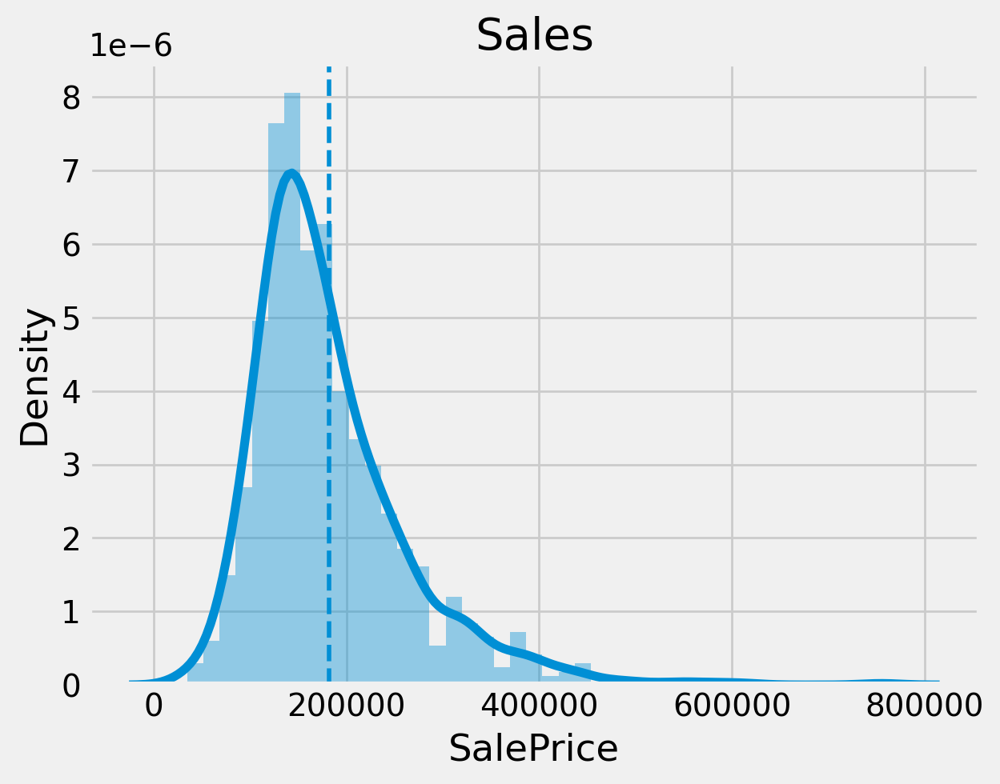

In [9]:
# Distribution of Target Variable
# checking the target variables for distribution
sns.distplot(df_train['SalePrice'])
plt.axvline(x=df_train['SalePrice'].mean(), linestyle='--', linewidth=2)
plt.title('Sales')

print("Skewness: %f" % abs(df_train['SalePrice']).skew())
print("Kurtosis: %f" % abs(df_train['SalePrice']).kurt())

In [10]:
# Finding numeric features
num_cols = [feature for feature in df_train.columns if df_train[feature].dtypes != 'O']

# Visualising Numericcal predictor variables with Target Variables
fig, axs = plt.subplots(ncols=3,figsize=(12, 120))
plt.subplots_adjust(right=2)
plt.subplots_adjust(top=2)
sns.color_palette("husl", 8)

for i, feature in enumerate(list(df_train[num_cols]), 1):
    plt.subplot(len(list(num_cols)), 3, i)
    sns.scatterplot(x=feature, y='SalePrice', hue='SalePrice', palette='Blues', data=df_train)
        
    plt.xlabel('{}'.format(feature), size=15,labelpad=12.5)
    plt.ylabel('SalePrice', size=15, labelpad=12.5)
    
    for j in range(2):
        plt.tick_params(axis='x', labelsize=12)
        plt.tick_params(axis='y', labelsize=12)
    
    plt.legend(loc='best', prop={'size': 10})
        
plt.show()

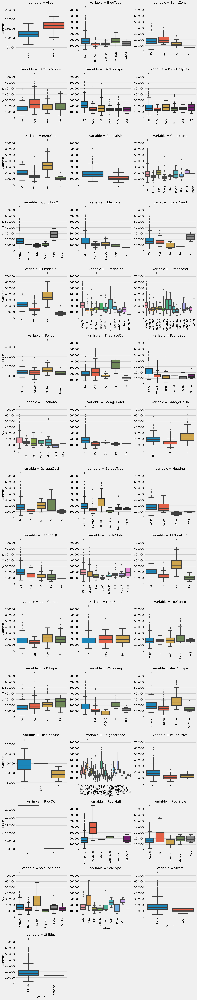

In [11]:
# Finding categorical features
cat_cols = [feature for feature in df_train.columns if df_train[feature].dtypes == 'O']

##Visualising Categorical predictor variables with Target Variables
def facetgrid_boxplot(x, y, **kwargs):
    sns.boxplot(x=x, y=y)
    x=plt.xticks(rotation=90)
    
f = pd.melt(df_train, id_vars=['SalePrice'], value_vars=sorted(df_train[cat_cols]))
g = sns.FacetGrid(f, col="variable", col_wrap=3, sharex=False, sharey=False, size=5)
g = g.map(facetgrid_boxplot, "value", "SalePrice")

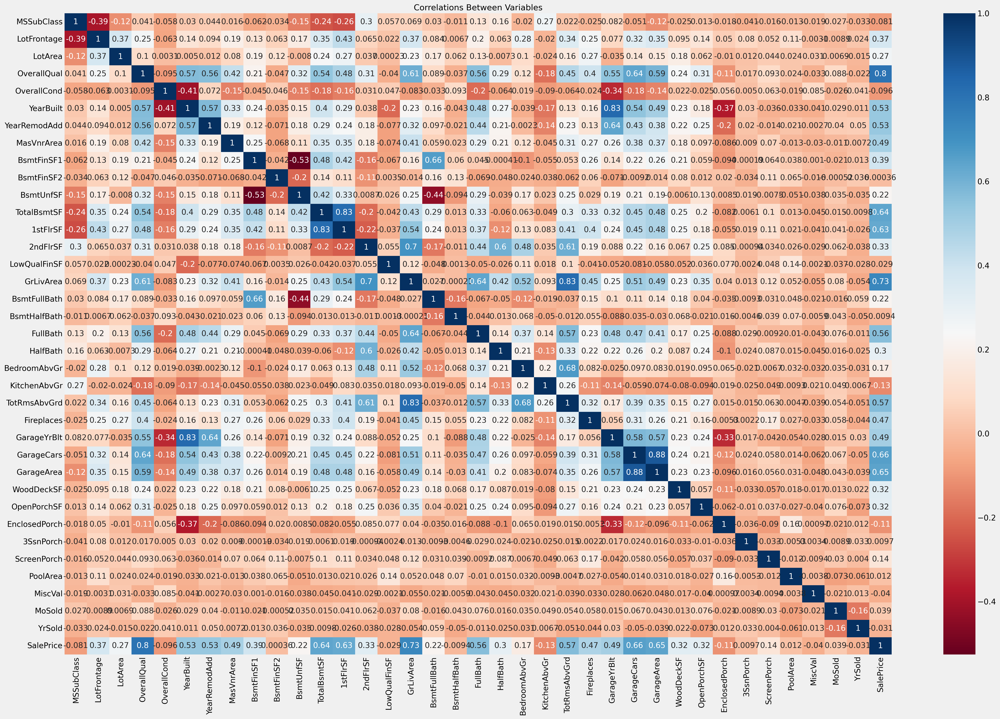

In [12]:
# correlation of features
plt.figure(figsize=(30,20))
sns.heatmap(df_train.corr(), cmap="RdBu",annot=True)
plt.title("Correlations Between Variables", size=15)
plt.show()

In [13]:
corr = df_train.corr()
corr_target = pd.DataFrame(corr['SalePrice'][(corr['SalePrice']>= 0.5) |(corr['SalePrice'] <= -0.5)])
corr_target.sort_values(by=['SalePrice'], ascending=False)


,SalePrice
SalePrice,1.000000
OverallQual,0.797666
GrLivArea,0.734997
GarageCars,0.658204
GarageArea,0.647953
TotalBsmtSF,0.642127
1stFlrSF,0.627749
TotRmsAbvGrd,0.570375
FullBath,0.559980
YearBuilt,0.527193


# Data Cleaning

In [14]:
y = df_train['SalePrice']
train_df = df_train.drop(['SalePrice'], axis=1)

In [15]:
train_df.shape

(1000, 79)

## Missing Value 

In [16]:
def missing_zero_values_table(train):

        zero_val = (train == 0.00).astype(int).sum(axis=0)
        mis_val = train.isnull().sum()
        mis_val_percent = 100 * train.isnull().sum() / len(train)
        missing_table = pd.concat([zero_val, mis_val, mis_val_percent], axis=1)
        missing_table = missing_table.rename(
        columns = {0 : 'Zero Values', 1 : 'Missing Values', 2 : '% of Missing Values'})
        missing_table['Data Type'] = train.dtypes
        missing_table = missing_table[missing_table.iloc[:,1] != 0].sort_values('% of Missing Values', ascending=False).round(1)
        print ("Selected dataframe has " + str(train.shape[1]) + " columns and " + str(train.shape[0]) + " Rows.\n"      
            "There are " + str(missing_table.shape[0]) + " columns that have missing values.")
        return missing_table

missing_zero_values_table(train_df)




Selected dataframe has 79 columns and 1000 Rows.
There are 18 columns that have missing values.


,Zero Values,Missing Values,% of Missing Values,Data Type
PoolQC,0,998,99.8,object
MiscFeature,0,957,95.7,object
Alley,0,935,93.5,object
Fence,0,806,80.6,object
FireplaceQu,0,478,47.8,object
LotFrontage,0,173,17.3,float64
GarageType,0,56,5.6,object
GarageYrBlt,0,56,5.6,float64
GarageFinish,0,56,5.6,object
GarageQual,0,56,5.6,object


In [17]:
# Columns with 40% or more missing values are excluded from the analysis.
# PoolQC, MiscFeature, Alley, Fence, FireplaceQu has a lot of missing values and it is categorical columns so remove it
train_df = train_df.drop(['PoolQC', 'MiscFeature', 'Fence','Alley', 'FireplaceQu'], axis=1)

In [18]:
# Classifing Variables to facilitate processing according to variable types.

# list of numerical variables
num_cols = [feature for feature in train_df.columns if train_df[feature].dtypes != 'O']

# list of categorical variables
cat_cols = [feature for feature in train_df.columns if train_df[feature].dtypes == 'O']

#print('Number of date variables: ', len(date_cols))
print('Number of numerical variables: ', len(num_cols))
print('Number of categorical variables: ', len(cat_cols))

Number of numerical variables:  36
Number of categorical variables:  38


In [19]:
from sklearn.impute import SimpleImputer

# Replace missing values by median values
train_df[num_cols] = SimpleImputer(strategy='median').fit_transform(train_df[num_cols])
# Replace missing values by 'None'
train_df[cat_cols] = train_df[cat_cols].fillna('None')

# results
missing_zero_values_table(train_df)

Selected dataframe has 74 columns and 1000 Rows.
There are 0 columns that have missing values.


,Zero Values,Missing Values,% of Missing Values,Data Type


In [20]:
# make a pipeline
from sklearn.base import BaseEstimator, TransformerMixin


class Dropper(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return     X.drop(['PoolQC', 'MiscFeature', 'Fence','Alley', 'FireplaceQu'], axis=1)
 
 
class Imputer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        # list of numerical variables
        num_cols = [feature for feature in X.columns if X[feature].dtypes != 'O']
        # list of categorical variables
        cat_cols = [feature for feature in X.columns if X[feature].dtypes == 'O']
        # Replace missing values by median values
        X[num_cols] = SimpleImputer(strategy='median').fit_transform(X[num_cols])
        # Replace missing values by 'None'
        X[cat_cols] = X[cat_cols].fillna('None')
        return X
    
pipe_Cleaning = Pipeline([
    ("dropper", Dropper()),
    ("imputer", Imputer())
])

pipe_Cleaning.fit_transform(df_train)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60.0,RL,65.0,8450.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0.0,0.0,0.0,0.0,0.0,2.0,2008.0,WD,Normal,208500.0
1,20.0,RL,80.0,9600.0,Pave,Reg,Lvl,AllPub,FR2,Gtl,...,0.0,0.0,0.0,0.0,0.0,5.0,2007.0,WD,Normal,181500.0
2,60.0,RL,68.0,11250.0,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0.0,0.0,0.0,0.0,0.0,9.0,2008.0,WD,Normal,223500.0
3,70.0,RL,60.0,9550.0,Pave,IR1,Lvl,AllPub,Corner,Gtl,...,272.0,0.0,0.0,0.0,0.0,2.0,2006.0,WD,Abnorml,140000.0
4,60.0,RL,84.0,14260.0,Pave,IR1,Lvl,AllPub,FR2,Gtl,...,0.0,0.0,0.0,0.0,0.0,12.0,2008.0,WD,Normal,250000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,50.0,RL,51.0,4712.0,Pave,IR1,Lvl,AllPub,Inside,Mod,...,0.0,0.0,63.0,0.0,0.0,8.0,2006.0,WD,Abnorml,121600.0
996,20.0,RL,70.0,10659.0,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0.0,0.0,0.0,0.0,0.0,1.0,2006.0,COD,Normal,136500.0
997,20.0,RL,70.0,11717.0,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0.0,0.0,0.0,0.0,0.0,2.0,2009.0,WD,Normal,185000.0
998,30.0,RM,60.0,9786.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,48.0,0.0,0.0,0.0,0.0,5.0,2006.0,WD,Normal,91000.0


# Features Selection

## Removing correlated features

In [21]:
print('Train Data Shape:',train_df.shape) #train set shape

num_cols = [feature for feature in train_df.columns if train_df[feature].dtypes != 'O']
cat_cols = [feature for feature in train_df.columns if train_df[feature].dtypes == 'O']

X_train, X_test, y_train, y_test = train_test_split(train_df[num_cols],y,
    test_size=0.3,
    random_state=0)

X_train.shape, X_test.shape

# find and remove correlated features
def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

corr_features = correlation(X_train, 0.8)
print('correlated features: ', len(set(corr_features)) )
corr_features

Train Data Shape: (1000, 74)
correlated features:  3


{'1stFlrSF', 'GarageArea', 'TotRmsAbvGrd'}

In [22]:
# removed correlated  features
X_train.drop(labels=corr_features, axis=1, inplace=True)
X_test.drop(labels=corr_features, axis=1, inplace=True)

X_train.shape, X_test.shape

((700, 33), (300, 33))

## Features Selection by Sequential Forward Selection (numerical data)

In [23]:
#step forward feature selection
sfs1 = SFS(RandomForestRegressor(), 
           k_features=10, 
           forward=True, 
           floating=False, 
           verbose=2,
           scoring='r2',
           cv=3)

sfs1 = sfs1.fit(np.array(X_train), y_train)

select_cols1 = X_train.columns[list(sfs1.k_feature_idx_)].tolist()
select_cols1
# select_cols1 = ['OverallCond', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath',
#                 'FullBath', 'KitchenAbvGr', 'PoolArea', 'MiscVal', 'MoSold']

## Features Selection by Mutual Information Selection (categorical data)

In [24]:
def make_mi_scores(X, y):
    X = X.copy()
    for colname in X.select_dtypes(["object", "category"]):
        X[colname], _ = X[colname].factorize()
    # All discrete features should now have integer dtypes
    discrete_features = [pd.api.types.is_integer_dtype(t) for t in X.dtypes]
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features, random_state=0)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores


def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")

In [25]:
mi_scores = make_mi_scores(train_df, y)
mi_scores

OverallQual     0.577275
Neighborhood    0.544105
GrLivArea       0.478688
GarageCars      0.360695
YearBuilt       0.353682
                  ...   
Condition2      0.000000
PoolArea        0.000000
MiscVal         0.000000
MoSold          0.000000
LandSlope       0.000000
Name: MI Scores, Length: 74, dtype: float64

In [26]:
mi_results = pd.DataFrame(mi_scores, index=train_df.columns).sort_values('MI Scores',ascending=False).reset_index()
mi_results = mi_results[mi_results['index'].isin(cat_cols)].head(10)
select_cols2 = mi_results['index'].tolist()
select_cols2

['Neighborhood',
 'ExterQual',
 'KitchenQual',
 'BsmtQual',
 'GarageFinish',
 'GarageType',
 'Foundation',
 'BsmtFinType1',
 'HeatingQC',
 'Exterior1st']

In [27]:
train_df = train_df[select_cols1+select_cols2]
train_df.shape

(1000, 19)

In [66]:
# make a pipeline
class FeatureSelection(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        X = X.drop(['1stFlrSF', 'GarageArea', 'TotRmsAbvGrd'], axis=1)
        col_by_sf = ['OverallCond', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath',
                'FullBath', 'KitchenAbvGr', 'PoolArea', 'MiscVal', 'MoSold']
        col_by_mi = ['Neighborhood','ExterQual','KitchenQual','BsmtQual','GarageFinish',
                     'GarageType','Foundation','BsmtFinType1','HeatingQC','Exterior1st']
        return X[select_cols1+select_cols2]
 
 
pipe_FeatureSelection = Pipeline([
    ("feature", FeatureSelection())
])

pipe_FeatureSelection.fit_transform(df_train)

,OverallCond,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,KitchenAbvGr,PoolArea,MiscVal,MoSold,Neighborhood,ExterQual,KitchenQual,BsmtQual,GarageFinish,GarageType,Foundation,BsmtFinType1,HeatingQC,Exterior1st
0,5,0,1,0,2,1,0,0,2,CollgCr,Gd,Gd,Gd,RFn,Attchd,PConc,GLQ,Ex,VinylSd
1,8,0,0,1,2,1,0,0,5,Veenker,TA,TA,Gd,RFn,Attchd,CBlock,ALQ,Ex,MetalSd
2,5,0,1,0,2,1,0,0,9,CollgCr,Gd,Gd,Gd,RFn,Attchd,PConc,GLQ,Ex,VinylSd
3,5,0,1,0,1,1,0,0,2,Crawfor,TA,Gd,TA,Unf,Detchd,BrkTil,ALQ,Gd,Wd Sdng
4,5,0,1,0,2,1,0,0,12,NoRidge,Gd,Gd,Gd,RFn,Attchd,PConc,GLQ,Ex,VinylSd
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,7,0,1,0,1,1,0,0,8,BrkSide,TA,TA,TA,Unf,Detchd,CBlock,ALQ,TA,MetalSd
996,6,0,1,0,1,1,0,0,1,NAmes,TA,TA,TA,Unf,Attchd,CBlock,Rec,TA,Wd Sdng
997,6,0,0,0,2,1,0,0,2,NWAmes,TA,TA,TA,RFn,Attchd,CBlock,Unf,TA,HdBoard
998,4,0,0,0,1,1,0,0,5,IDOTRR,TA,TA,TA,Unf,Detchd,BrkTil,Unf,Fa,Wd Sdng


# Feature Engineering

## label encoding and factorizing variables

In [29]:
# Encode the label of the attributes represented for quality.
num_cols = [feature for feature in train_df.columns if train_df[feature].dtypes != 'O']
cat_cols = [feature for feature in train_df.columns if train_df[feature].dtypes == 'O']
qual_lst = []
for i in range(len(cat_cols)):
    tmp = train_df[(train_df[cat_cols[i]] == 'Po') | 
                   (train_df[cat_cols[i]] == 'Fa') | 
                   (train_df[cat_cols[i]] == 'TA') | 
                   (train_df[cat_cols[i]] == 'Ex')]
    if len(tmp)>0:
        qual_lst.append(cat_cols[i])

print(qual_lst)

# df_train['ExterCond'].value_counts()# check the value

# Ex   Excellent
# Gd   Good
# TA   Average/Typical
# Fa   Fair
# Po   Poor

qualities = {'None' : 0, 'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5}
train_df[qual_lst] = train_df[qual_lst].replace(qualities) 

train_df[qual_lst].head()

['ExterQual', 'KitchenQual', 'BsmtQual', 'HeatingQC']


,ExterQual,KitchenQual,BsmtQual,HeatingQC
0,4,4,4,5
1,3,3,4,5
2,4,4,4,5
3,3,4,3,4
4,4,4,4,5


In [30]:
# Changing some numeric variables into factors(object) - month 
# train_df['MoSold'] = train_df['MoSold'].astype(object)

In [31]:
train_df.head(5)

,OverallCond,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,KitchenAbvGr,PoolArea,MiscVal,MoSold,Neighborhood,ExterQual,KitchenQual,BsmtQual,GarageFinish,GarageType,Foundation,BsmtFinType1,HeatingQC,Exterior1st
0,5.0,0.0,1.0,0.0,2.0,1.0,0.0,0.0,2.0,CollgCr,4,4,4,RFn,Attchd,PConc,GLQ,5,VinylSd
1,8.0,0.0,0.0,1.0,2.0,1.0,0.0,0.0,5.0,Veenker,3,3,4,RFn,Attchd,CBlock,ALQ,5,MetalSd
2,5.0,0.0,1.0,0.0,2.0,1.0,0.0,0.0,9.0,CollgCr,4,4,4,RFn,Attchd,PConc,GLQ,5,VinylSd
3,5.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,2.0,Crawfor,3,4,3,Unf,Detchd,BrkTil,ALQ,4,Wd Sdng
4,5.0,0.0,1.0,0.0,2.0,1.0,0.0,0.0,12.0,NoRidge,4,4,4,RFn,Attchd,PConc,GLQ,5,VinylSd


## Outlier

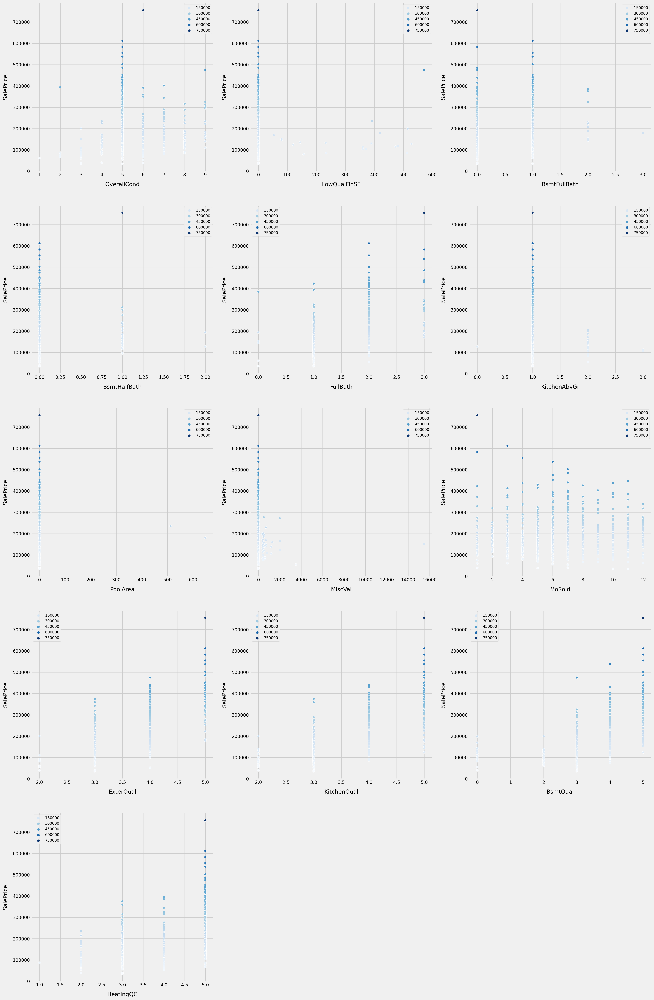

In [32]:
# check outlier
num_cols = [feature for feature in train_df.columns if train_df[feature].dtypes != 'O']
cat_cols = [feature for feature in train_df.columns if train_df[feature].dtypes == 'O']

data = train_df[num_cols]

# visualising some more outliers in the data values
fig, axs = plt.subplots(ncols=3,figsize=(12, 50))
plt.subplots_adjust(right=2)
plt.subplots_adjust(top=2)
sns.color_palette("husl", 8)

for i, feature in enumerate(list(data), 1):
    plt.subplot(len(list(num_cols)), 3, i)
    sns.scatterplot(x=train_df[feature], y=y, hue=y, palette='Blues', data=data)
        
    plt.xlabel('{}'.format(feature), size=15,labelpad=12.5)
    plt.ylabel('SalePrice', size=15, labelpad=12.5)
    
    for j in range(2):
        plt.tick_params(axis='x', labelsize=12)
        plt.tick_params(axis='y', labelsize=12)
    
    plt.legend(loc='best', prop={'size': 10})
        
plt.show()

In [33]:
train_df.shape

(1000, 19)

## Scaling

In [36]:
Scaler = MinMaxScaler()
scaled_data = Scaler.fit_transform(train_df[num_cols])
train_df[num_cols] = pd.DataFrame(scaled_data, columns=train_df[num_cols].columns)
train_df.head()

,OverallCond,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,KitchenAbvGr,PoolArea,MiscVal,MoSold,Neighborhood,ExterQual,KitchenQual,BsmtQual,GarageFinish,GarageType,Foundation,BsmtFinType1,HeatingQC,Exterior1st
0,0.500,0.0,0.333333,0.0,0.666667,0.333333,0.0,0.0,0.090909,CollgCr,0.666667,0.666667,0.8,RFn,Attchd,PConc,GLQ,1.00,VinylSd
1,0.875,0.0,0.000000,0.5,0.666667,0.333333,0.0,0.0,0.363636,Veenker,0.333333,0.333333,0.8,RFn,Attchd,CBlock,ALQ,1.00,MetalSd
2,0.500,0.0,0.333333,0.0,0.666667,0.333333,0.0,0.0,0.727273,CollgCr,0.666667,0.666667,0.8,RFn,Attchd,PConc,GLQ,1.00,VinylSd
3,0.500,0.0,0.333333,0.0,0.333333,0.333333,0.0,0.0,0.090909,Crawfor,0.333333,0.666667,0.6,Unf,Detchd,BrkTil,ALQ,0.75,Wd Sdng
4,0.500,0.0,0.333333,0.0,0.666667,0.333333,0.0,0.0,1.000000,NoRidge,0.666667,0.666667,0.8,RFn,Attchd,PConc,GLQ,1.00,VinylSd


In [169]:
# make a pipeline
class LabelEncoder(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        cat_cols = [feature for feature in X.columns if X[feature].dtypes == 'O']
        qual_lst = ['ExterQual', 'KitchenQual', 'BsmtQual', 'HeatingQC']
        qualities = {'None' : 0, 'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5}
        X[qual_lst] = X[qual_lst].replace(qualities) 
        X['MoSold'] = X['MoSold'].astype(object)
        return X

class MinMax(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        X2 = X.copy()
        num_cols = [feature for feature in X.columns if X[feature].dtypes != 'O']
        Scaler = MinMaxScaler()
        X_scaled = Scaler.fit_transform(X[num_cols])
        X2[num_cols] = pd.DataFrame(X_scaled, columns=X[num_cols].columns)
        return X2


pipe_FeatureEngineering = Pipeline([
    ("label", LabelEncoder()),
  #  ('Normalize', MinMax() )
])

pipe_FeatureEngineering.fit_transform(df_train)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0.235294,RL,0.150685,0.033420,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0.0,NaN,NaN,NaN,0.0,2,0.50,WD,Normal,0.241078
1,0.000000,RL,0.202055,0.038795,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0.0,NaN,NaN,NaN,0.0,5,0.25,WD,Normal,0.203583
2,0.235294,RL,0.160959,0.046507,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0.0,NaN,NaN,NaN,0.0,9,0.50,WD,Normal,0.261908
3,0.294118,RL,0.133562,0.038561,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0.0,NaN,NaN,NaN,0.0,2,0.00,WD,Abnorml,0.145952
4,0.235294,RL,0.215753,0.060576,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0.0,NaN,NaN,NaN,0.0,12,0.50,WD,Normal,0.298709
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.176471,RL,0.102740,0.015948,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0.0,NaN,MnPrv,NaN,0.0,8,0.00,WD,Abnorml,0.120400
996,0.000000,RL,NaN,0.043745,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0.0,NaN,NaN,NaN,0.0,1,0.00,COD,Normal,0.141092
997,0.000000,RL,NaN,0.048690,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0.0,NaN,NaN,NaN,0.0,2,0.75,WD,Normal,0.208443
998,0.058824,RM,0.133562,0.039664,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0.0,NaN,NaN,NaN,0.0,5,0.00,WD,Normal,0.077906


In [170]:
#Stack all pipes for preprocessing
preprocess_data = Pipeline([("Data Cleaning",pipe_Cleaning),
                            ("Feature Selection",pipe_FeatureSelection),
                            ("Feature Engineering",pipe_FeatureEngineering)])
preprocess_data

Pipeline(steps=[('Data Cleaning',
                 Pipeline(steps=[('dropper', Dropper()),
                                 ('imputer', Imputer())])),
                ('Feature Selection',
                 Pipeline(steps=[('feature', FeatureSelection())])),
                ('Feature Engineering',
                 Pipeline(steps=[('label', LabelEncoder())]))])

In [171]:
preprocess_data.fit_transform(df_train).shape

(1000, 19)

# Modeling

## Split and Scaling data

In [257]:
# prepare dataset for modeling
# train_data = preprocess_data(df_train)
data = preprocess_data.fit_transform(df_train.drop('SalePrice', axis=1))

# onehot encoding : train and test set has different categories for each columns so it is encoded this right before traing
ohe = OneHotEncoder(sparse=False, handle_unknown='ignore')
data = ohe.fit_transform(data)

# Scale for feature columns
scaler_x = MinMaxScaler()
data = scaler_x.fit_transform(data)

# scale for target column
scaler_y = MinMaxScaler()
y = scaler_y.fit_transform(np.array(df_train['SalePrice']).reshape(-1,1))

# split validation data from train set for validation
X_train, X_val, y_train, y_val = train_test_split(data, y, test_size=0.3, random_state=101)

X_train.shape, X_val.shape, y_train.shape, y_val.shape

((700, 152), (300, 152), (700, 1), (300, 1))

## Baseline Modeling

In [261]:
#Support Vector Regressor MODEL
svrmodel = SVR()
svrmodel.fit(X_train, y_train)
svr_pred = svrmodel.predict(X_val)
print('SUPPORT VECTOR REGRESSOR RMSE:', np.sqrt(mse(y_val, svr_pred))) 

#Gradient Boosting Regressor MODEL
gbrmodel = GradientBoostingRegressor()  
gbrmodel.fit(X_train, y_train)
gbr_pred = gbrmodel.predict(X_val)
print('GRADIENT BOOSTING REGRESSOR RMSE:', np.sqrt(mse(y_val, gbr_pred)))

#DECISION TREE MODEL
DTmodel = DecisionTreeRegressor(random_state = 100)
DTmodel.fit(X_train, y_train)
dtr_pred = DTmodel.predict(X_val)
print('DECISION TREE MODEL RMSE:', np.sqrt(mse(y_val, dtr_pred))) 

#Random Forest Regressor MODEL
rfmodel = RandomForestRegressor()
rfmodel.fit(X_train, y_train)
rf_pred = rfmodel.predict(X_val)
print('RANDOM FOREST REGRESSOR  RMSE:', np.sqrt(mse(y_val, rf_pred))) 

#XGBOOST REGRESSOR MODEL
xgmodel = xgb.XGBRegressor()
xgmodel.fit(X_train, y_train)
xg_pred = xgmodel.predict(X_val)
print('XGBOOST REGRESSOR  RMSE:', np.sqrt(mse(y_val, xg_pred))) 

#LIGHTGBM REGRESSOR MODEL
LGmodel = lgb.LGBMRegressor()
LGmodel.fit(X_train, y_train)
LG_pred = LGmodel.predict(X_val)
print('LIGHTGBM REGRESSOR RMSE:', np.sqrt(mse(y_val, LG_pred))) 

SUPPORT VECTOR REGRESSOR RMSE: 0.07556028986937953
GRADIENT BOOSTING REGRESSOR RMSE: 0.059547562944505215
DECISION TREE MODEL RMSE: 0.09096930151975949
RANDOM FOREST REGRESSOR  RMSE: 0.06875252363662591
XGBOOST REGRESSOR  RMSE: 0.06828612766728123
LIGHTGBM REGRESSOR RMSE: 0.0676200414467153


## Hyper Parameter tuning

we proceed with parameter tuning using the best performance GBR model.

In [262]:
'''from sklearn.model_selection import GridSearchCV

param_tuning = {
    'max_depth': range (2, 10, 1),
    'n_estimators': range(60, 220, 40),
    'learning_rate': [0.1, 0.01, 0.05]}

grid_search = GridSearchCV(estimator = XGBRegressor(),
                           param_grid = param_tuning, 
                           cv = 5,
                           return_train_score=True)

grid_search.fit(X_train, y_train)

grid_search.best_params_'''

"from sklearn.model_selection import GridSearchCV\n\nparam_tuning = {\n    'max_depth': range (2, 10, 1),\n    'n_estimators': range(60, 220, 40),\n    'learning_rate': [0.1, 0.01, 0.05]}\n\ngrid_search = GridSearchCV(estimator = XGBRegressor(),\n                           param_grid = param_tuning, \n                           cv = 5,\n                           return_train_score=True)\n\ngrid_search.fit(X_train, y_train)\n\ngrid_search.best_params_"

In [263]:
'''from sklearn.model_selection import GridSearchCV

param_tuning = {
        'n_estimators': [500, 1000,3000],
        'max_depth': [3, 5, 7],
        'min_samples_leaf': [1, 3, 5],
        'min_samples_split': [1, 3, 5],
        'learning_rate': [0.01, 0.1]}

grid_search = GridSearchCV(estimator = XGBRegressor(loss='huber',max_features='sqrt'),
                           param_grid = param_tuning, 
                           cv = 5,
                           return_train_score=True)

grid_search.fit(X_train, y_train)

grid_search.best_params_'''

"from sklearn.model_selection import GridSearchCV\n\nparam_tuning = {\n        'n_estimators': [500, 1000,3000],\n        'max_depth': [3, 5, 7],\n        'min_samples_leaf': [1, 3, 5],\n        'min_samples_split': [1, 3, 5],\n        'learning_rate': [0.01, 0.1]}\n\ngrid_search = GridSearchCV(estimator = XGBRegressor(loss='huber',max_features='sqrt'),\n                           param_grid = param_tuning, \n                           cv = 5,\n                           return_train_score=True)\n\ngrid_search.fit(X_train, y_train)\n\ngrid_search.best_params_"

In [264]:
xgb_params = {'learning_rate': 0.05, 'max_depth': 4, 'n_estimators': 180}
gbr_params = {'n_estimators': 1000, 'max_depth':5, 'min_samples_leaf':5, 'min_samples_split':5, 
          'learning_rate': 0.01, 'loss': 'huber', 'max_features':'sqrt'}

#XGBOOST REGRESSOR MODEL
xgmodel2 = xgb.XGBRegressor(**xgb_params)
xgmodel2.fit(X_train, y_train)
xg_pred2 = xgmodel2.predict(X_val)
print('XGBOOST REGRESSOR  RMSE:', np.sqrt(mse(y_val, xg_pred2))) 

#Gradient Boosting Regressor MODEL
gbrmodel2 = GradientBoostingRegressor(**gbr_params) 
gbrmodel2.fit(X_train, y_train)
gbr_pred2 = gbrmodel2.predict(X_val)
print('GRADIENT BOOSTING REGRESSOR RMSE:', np.sqrt(mse(y_val, gbr_pred2)))

XGBOOST REGRESSOR  RMSE: 0.06283323047398115
GRADIENT BOOSTING REGRESSOR RMSE: 0.06072354970516079


## Stack up models


In [265]:
# Stack up all the models above, optimized using xgboost
stack_gen = StackingCVRegressor(regressors=(DTmodel,xgmodel, LGmodel, svrmodel, gbrmodel, rfmodel),
                                meta_regressor=xgmodel,use_features_in_secondary=True)
stack_gen.fit(X_train,y_train)
stack_pred = stack_gen.predict(X_val)

print('Stack up all the models RMSE:', np.sqrt(mse(y_val, stack_pred))) 

Stack up all the models RMSE: 0.06661648348624084


## Prediction of Test data

In [266]:
test_data = preprocess_data.fit_transform(df_test)
test_data = ohe.transform(test_data)
test_data = scaler_x.transform(test_data)
test_data.shape

(460, 152)

In [267]:
y_pred = gbrmodel2.predict(test_data)
y_pred

array([0.04902021, 0.14116768, 0.26528912, 0.14006921, 0.21664873,
       0.21258689, 0.16855982, 0.10466788, 0.27149097, 0.13859729,
       0.15639492, 0.08354556, 0.16366717, 0.11878377, 0.1181697 ,
       0.2843445 , 0.26388035, 0.21352927, 0.22715588, 0.21597421,
       0.17307908, 0.25920693, 0.1138932 , 0.21664873, 0.26263868,
       0.12191932, 0.13972561, 0.27074081, 0.13555742, 0.1070807 ,
       0.12943689, 0.19706715, 0.39232792, 0.24971305, 0.14893488,
       0.07011256, 0.38957245, 0.24702065, 0.06171004, 0.10489747,
       0.18519381, 0.16451553, 0.27517302, 0.22890231, 0.3187737 ,
       0.16498026, 0.45822412, 0.14242125, 0.10432263, 0.10761096,
       0.23120617, 0.2355077 , 0.14788231, 0.12389923, 0.27285452,
       0.19660902, 0.28184562, 0.34269357, 0.50950794, 0.16340147,
       0.30435696, 0.08483592, 0.11607951, 0.12869814, 0.15642485,
       0.34305089, 0.22770982, 0.15488104, 0.18456673, 0.1370555 ,
       0.14194377, 0.15095061, 0.07540011, 0.13750753, 0.23587

In [269]:
rescaled_pred = scaler_y.inverse_transform(np.array(y_pred).reshape(-1,1))
rescaled_pred = rescaled_pred.flatten().tolist()
rescaled_pred

[70199.45420577287,
 136554.84439135648,
 225934.69210144185,
 135763.84014932436,
 190908.74769674812,
 187983.82241166002,
 156279.92464280277,
 110271.34233506139,
 230400.65052380876,
 134703.90776084404,
 147519.9835690531,
 95061.15489880742,
 152756.7277870741,
 120436.19531905212,
 119994.00133138063,
 239656.47334332866,
 224920.23656338535,
 188662.42645764514,
 198474.95041600184,
 190423.02813759222,
 159534.2436127502,
 221554.91275278758,
 116914.48987757247,
 190908.74769674812,
 224026.1167843666,
 122694.10165007942,
 135516.4102660532,
 229860.45407933512,
 132514.89849770805,
 112008.81513795466,
 128107.50477542356,
 176808.05155846616,
 317415.3324811478,
 214718.37015158497,
 142148.00825761876,
 85388.05481042275,
 315431.12445271976,
 212779.57083753048,
 79337.39865341205,
 110436.66775881658,
 168258.0605037493,
 153367.63381254906,
 233052.08825571375,
 199732.5546377463,
 264448.94226653845,
 153702.28185146645,
 364867.18937459606,
 137457.54163136755,
 110

# Submition File

In [270]:
# Save your predictions
df_results = pd.DataFrame(index=list(range(1000,1460)),data={'SalePrice':rescaled_pred})
df_results.to_csv("results.csv", index_label='id')
df_results.head()

,SalePrice
1000,70199.454206
1001,136554.844391
1002,225934.692101
1003,135763.840149
1004,190908.747697
